# 02 - Model Inference and Comparison

This notebook demonstrates:
1. **Loading trained models** (Teacher and Student)
2. **Running inference** on the holdout set
3. **Comparing predictions** between Teacher and Student
4. **Analyzing disagreements** with visual examples
5. **Error analysis** with sample images

---

## 1. Setup and Imports

In [1]:
import sys
from pathlib import Path

# Add project root to path
PROJECT_ROOT = Path().absolute().parent
sys.path.insert(0, str(PROJECT_ROOT))

import torch
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Project imports
from src.config import (
    set_seed, 
    CHECKPOINTS_DIR, 
    PROCESSED_DIR, 
    FIGURES_DIR,
    MODELS_DIR,
    DataConfig,
    TeacherConfig,
    StudentConfig,
)
from src.models import (
    TeacherModel, 
    StudentModel,
    export_to_onnx,
    export_to_torchscript,
    validate_onnx,
    validate_torchscript,
)
from src.data.dataset import HAM10000Dataset, get_eval_transforms
from src.evaluation import (
    load_model_from_checkpoint,
    get_batch_predictions,
    build_comparison_dataframe,
    analyze_disagreements,
    compute_metrics,
    plot_probability_comparison,
    plot_disagreement_analysis,
    plot_sample_images,
    generate_comparison_summary,
    predict_single_image,
    plot_confusion_matrices,
    plot_roc_curves,
    plot_pr_curves,
)

# Set seed for reproducibility
set_seed(42)

# Device configuration
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# Plotting style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# Output directory
OUTPUT_DIR = FIGURES_DIR / "02_inference"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

%matplotlib inline

Using device: mps


## 2. Load Models

We'll load:
- **Teacher**: EfficientNet-B1 (best performing teacher, ROC-AUC: 0.924)
- **Student**: MobileNetV3-Small with T=1.0, α=0.5 (ROC-AUC: 0.921)

In [2]:
# Load Teacher (EfficientNet-B1)
TEACHER_CKPT = CHECKPOINTS_DIR / "teacher_efficientnet_b1_focal_best.pth"
teacher_config = TeacherConfig(architecture="efficientnet_b1")
teacher_model = TeacherModel(teacher_config)
teacher_model = load_model_from_checkpoint(teacher_model, TEACHER_CKPT, DEVICE)
print(f"✓ Loaded Teacher: {teacher_config.architecture}")
print(f"  Parameters: {sum(p.numel() for p in teacher_model.parameters()):,}")

# Load Student (MobileNetV3-Small, T=1.0, α=0.5)
STUDENT_CKPT = CHECKPOINTS_DIR / "student_T1.0_alpha0.5_best.pth"
student_config = StudentConfig(architecture="mobilenet_v3_small")
student_model = StudentModel(student_config)
student_model = load_model_from_checkpoint(student_model, STUDENT_CKPT, DEVICE)
print(f"\n✓ Loaded Student: {student_config.architecture}")
print(f"  Parameters: {sum(p.numel() for p in student_model.parameters()):,}")

✓ Loaded Teacher: efficientnet_b1
  Parameters: 6,514,465

✓ Loaded Student: mobilenet_v3_small
  Parameters: 1,518,881

✓ Loaded Student: mobilenet_v3_small
  Parameters: 1,518,881


## 3. Load Holdout Data

In [3]:
# Load holdout dataset
holdout_csv = PROCESSED_DIR / "holdout_data.csv"
holdout_df = pd.read_csv(holdout_csv)
print(f"Holdout set size: {len(holdout_df)} images")
print(f"Melanoma prevalence: {holdout_df['target'].mean():.1%}")

# Create dataset with evaluation transforms
data_config = DataConfig()
eval_transform = get_eval_transforms(data_config)

holdout_dataset = HAM10000Dataset(
    csv_path=holdout_csv,
    transform=eval_transform,
)

print(f"\nSample distribution:")
print(holdout_df['target'].value_counts())

Holdout set size: 1513 images
Melanoma prevalence: 11.4%

Sample distribution:
target
0    1341
1     172
Name: count, dtype: int64


## 4. Run Inference on Both Models

In [4]:
# Run inference on both models using src module
print("Running inference on Teacher model...")
teacher_results = get_batch_predictions(teacher_model, holdout_dataset, DEVICE)

print("\nRunning inference on Student model...")
student_results = get_batch_predictions(student_model, holdout_dataset, DEVICE)

print("\n✓ Inference complete!")

Running inference on Teacher model...


Running inference:   0%|          | 0/48 [00:00<?, ?it/s]

Running inference: 100%|██████████| 48/48 [00:09<00:00,  4.81it/s]



Running inference on Student model...


Running inference: 100%|██████████| 48/48 [00:07<00:00,  6.03it/s]


✓ Inference complete!


## 5. Create Comparison DataFrame

In [5]:
# Build comparison dataframe using src module
comparison_df = build_comparison_dataframe(holdout_df, teacher_results, student_results)

print(f"Total samples: {len(comparison_df)}")
print(f"Models agree: {comparison_df['models_agree'].sum()} ({comparison_df['models_agree'].mean():.1%})")
print(f"Models disagree: {(~comparison_df['models_agree']).sum()} ({(~comparison_df['models_agree']).mean():.1%})")

comparison_df.head(10)

Total samples: 1513
Models agree: 1331 (88.0%)
Models disagree: 182 (12.0%)


,image_id,image_path,true_label,teacher_prob,teacher_pred,student_prob,student_pred,prob_diff,abs_prob_diff,models_agree,teacher_correct,student_correct
0,ISIC_0029176,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.076707,0,0.021044,0,0.055663,0.055663,True,True,True
1,ISIC_0029068,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.255258,0,0.005221,0,0.250038,0.250038,True,True,True
2,ISIC_0031326,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.352537,0,0.093000,0,0.259537,0.259537,True,True,True
3,ISIC_0024981,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.532359,1,0.363972,0,0.168387,0.168387,False,False,True
4,ISIC_0027815,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.275679,0,0.003921,0,0.271759,0.271759,True,True,True
5,ISIC_0024324,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.416488,0,0.013147,0,0.403340,0.403340,True,True,True
6,ISIC_0029559,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.465770,0,0.020758,0,0.445012,0.445012,True,True,True
7,ISIC_0024832,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.404058,0,0.095763,0,0.308295,0.308295,True,True,True
8,ISIC_0026958,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.399505,0,0.098896,0,0.300609,0.300609,True,True,True
9,ISIC_0031624,/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_...,0,0.076244,0,0.011468,0,0.064776,0.064776,True,True,True


## 6. Overall Model Comparison

In [6]:
# Compute metrics using src module
teacher_metrics = compute_metrics(
    comparison_df['true_label'].values, 
    comparison_df['teacher_prob'].values, 
    comparison_df['teacher_pred'].values
)

student_metrics = compute_metrics(
    comparison_df['true_label'].values, 
    comparison_df['student_prob'].values, 
    comparison_df['student_pred'].values
)

metrics_df = pd.DataFrame({
    'Teacher (EfficientNet-B1)': teacher_metrics.to_dict(),
    'Student (MobileNetV3)': student_metrics.to_dict(),
}).T

print("=" * 60)
print("MODEL PERFORMANCE COMPARISON")
print("=" * 60)
display(metrics_df.round(4))

MODEL PERFORMANCE COMPARISON


,ROC-AUC,PR-AUC,F1,Accuracy
Teacher (EfficientNet-B1),0.9193,0.7073,0.5598,0.8638
Student (MobileNetV3),0.9214,0.6646,0.6418,0.9048


## 6.1 Confusion Matrices

Visual comparison of classification performance showing true/false positives and negatives.

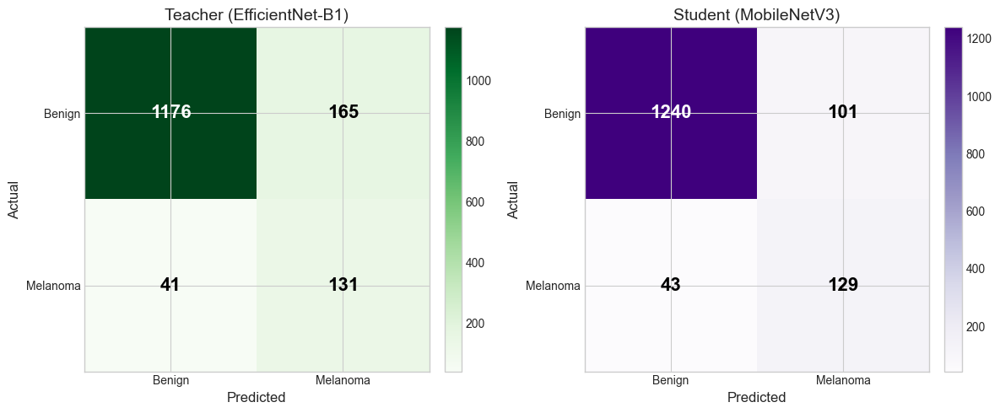

In [7]:
# Plot confusion matrices for both models
fig = plot_confusion_matrices(
    comparison_df,
    save_path=OUTPUT_DIR / "confusion_matrices.png"
)
plt.show()

## 6.2 ROC Curve Comparison

Receiver Operating Characteristic curves show the trade-off between sensitivity (true positive rate) and specificity (1 - false positive rate).

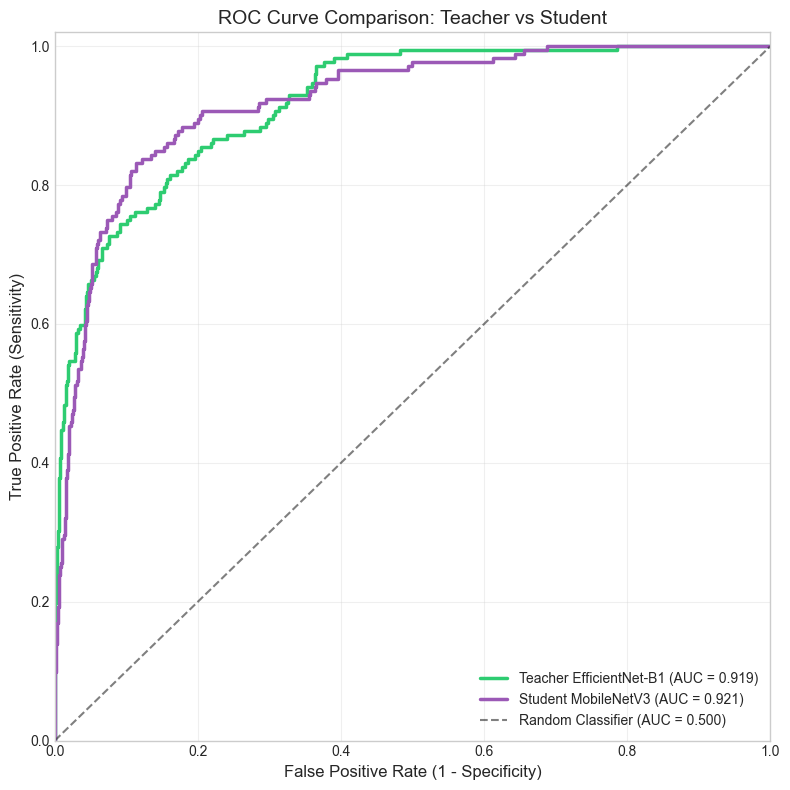


ROC-AUC Difference (Teacher - Student): -0.0021
The student retains 100.2% of teacher's discriminative ability


In [8]:
# Plot ROC curves for both models
fig = plot_roc_curves(
    comparison_df,
    save_path=OUTPUT_DIR / "roc_comparison.png"
)
plt.show()

# Print AUC difference
auc_diff = teacher_metrics.roc_auc - student_metrics.roc_auc
print(f"\nROC-AUC Difference (Teacher - Student): {auc_diff:.4f}")
print(f"The student retains {student_metrics.roc_auc / teacher_metrics.roc_auc:.1%} of teacher's discriminative ability")

## 6.3 Precision-Recall Curve Comparison

PR curves are especially informative for imbalanced datasets like melanoma detection. The markers show the recall achievable at 95% precision (important for clinical settings where false positives are costly).

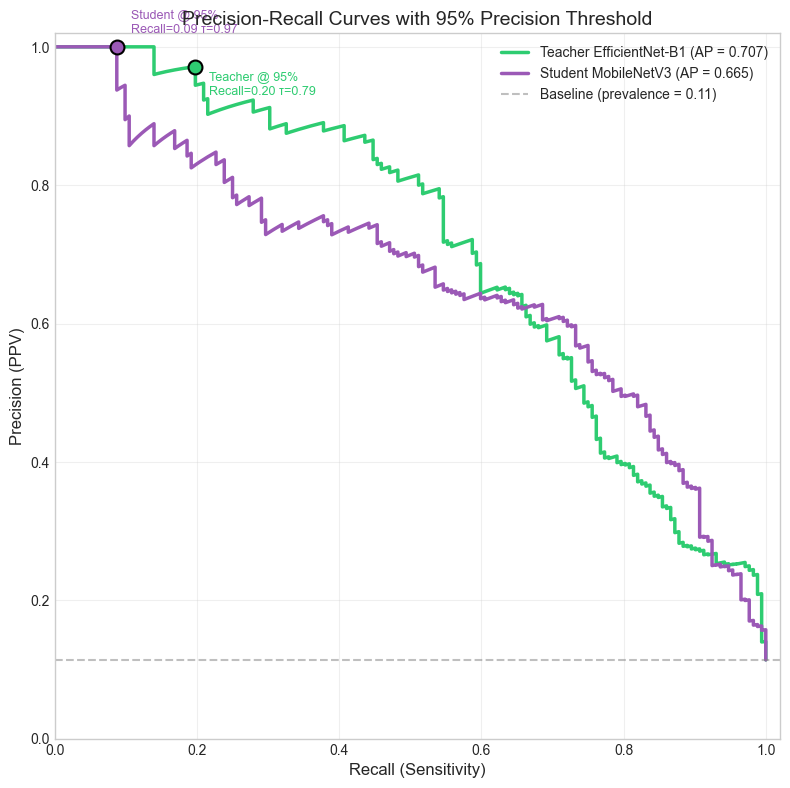


📊 At 95% Precision (PPV):
  - Teacher can achieve 20% recall (catch 20% of melanomas) while being 95% sure of positives
  - Student can achieve 9% recall at the same 95% precision level
  - Higher threshold needed for Student to achieve clinical-grade precision


In [9]:
# Plot PR curves with 95% precision threshold marked
fig = plot_pr_curves(
    comparison_df,
    precision_threshold=0.95,
    save_path=OUTPUT_DIR / "pr_curves.png"
)
plt.show()

# Summary of what the threshold points mean
print("\n📊 At 95% Precision (PPV):")
print("  - Teacher can achieve 20% recall (catch 20% of melanomas) while being 95% sure of positives")
print("  - Student can achieve 9% recall at the same 95% precision level")
print("  - Higher threshold needed for Student to achieve clinical-grade precision")

## 7. Probability Distribution Comparison

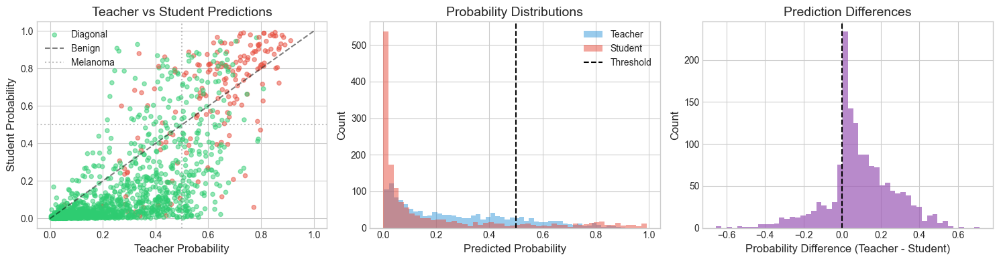


Mean absolute probability difference: 0.1494
Max probability difference: 0.7131


In [10]:
# Plot probability comparison using src module
fig = plot_probability_comparison(
    comparison_df, 
    save_path=OUTPUT_DIR / "probability_comparison.png"
)
plt.show()

print(f"\nMean absolute probability difference: {comparison_df['abs_prob_diff'].mean():.4f}")
print(f"Max probability difference: {comparison_df['abs_prob_diff'].max():.4f}")

## 8. Disagreement Analysis

Let's look at cases where the Teacher and Student make different predictions.

In [11]:
# Analyze disagreements using src module
disagreements = analyze_disagreements(comparison_df)

print(f"Total disagreements: {len(disagreements)} ({len(disagreements)/len(comparison_df):.1%})")
print("\nDisagreement breakdown:")
print(disagreements['category'].value_counts())
print("\nWho is correct in disagreements:")
print(disagreements['who_is_right'].value_counts())

Total disagreements: 182 (12.0%)

Disagreement breakdown:
category
Teacher predicts Melanoma, Student predicts Benign    124
Teacher predicts Benign, Student predicts Melanoma     58
Name: count, dtype: int64

Who is correct in disagreements:
who_is_right
Student    122
Teacher     60
Name: count, dtype: int64


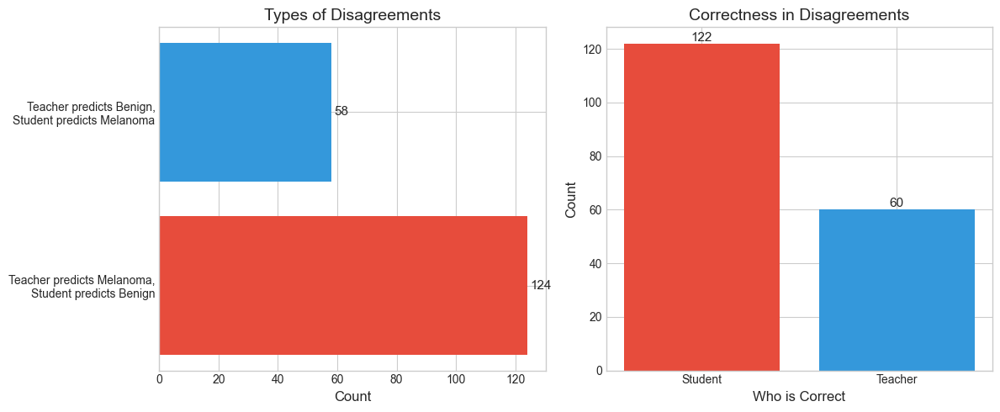

In [12]:
# Visualize disagreement patterns using src module
fig = plot_disagreement_analysis(
    disagreements,
    save_path=OUTPUT_DIR / "disagreement_analysis.png"
)
plt.show()

## 9. Visual Examples of Disagreements

Let's look at actual images where the models disagree.

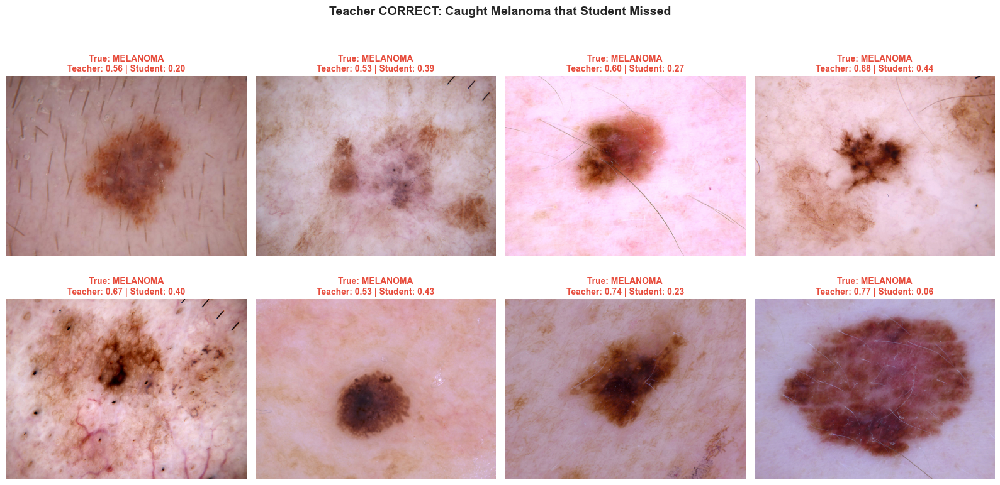

In [13]:
# Case 1: Teacher says Melanoma, Student says Benign - Teacher is RIGHT
teacher_right = disagreements[
    (disagreements['teacher_pred'] == 1) & 
    (disagreements['student_pred'] == 0) & 
    (disagreements['true_label'] == 1)
]

if len(teacher_right) > 0:
    fig = plot_sample_images(
        teacher_right, 
        "Teacher CORRECT: Caught Melanoma that Student Missed",
        n_samples=8,
        save_path=OUTPUT_DIR / "teacher_correct_melanoma.png"
    )
    plt.show()
else:
    print("No cases where Teacher correctly identified melanoma that Student missed.")

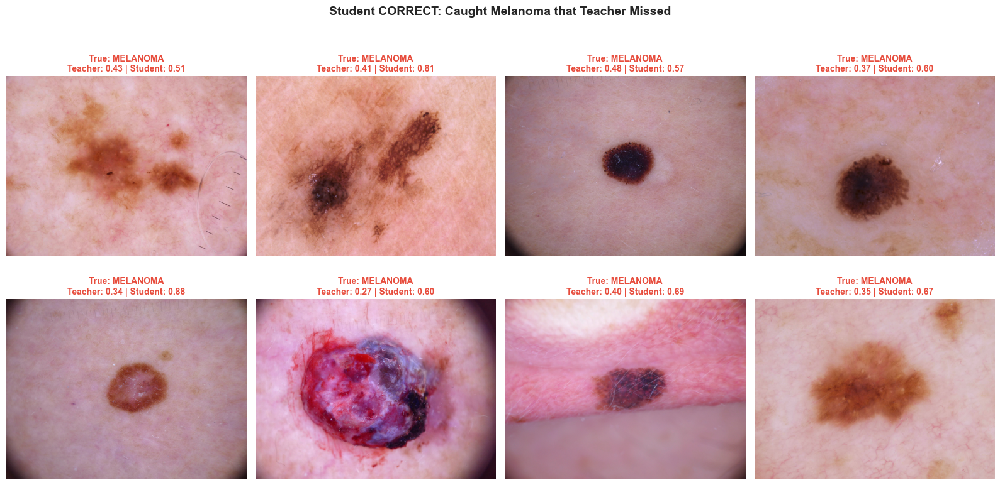

In [14]:
# Case 2: Student says Melanoma, Teacher says Benign - Student is RIGHT
student_right = disagreements[
    (disagreements['student_pred'] == 1) & 
    (disagreements['teacher_pred'] == 0) & 
    (disagreements['true_label'] == 1)
]

if len(student_right) > 0:
    fig = plot_sample_images(
        student_right, 
        "Student CORRECT: Caught Melanoma that Teacher Missed",
        n_samples=8,
        save_path=OUTPUT_DIR / "student_correct_melanoma.png"
    )
    plt.show()
else:
    print("No cases where Student correctly identified melanoma that Teacher missed.")

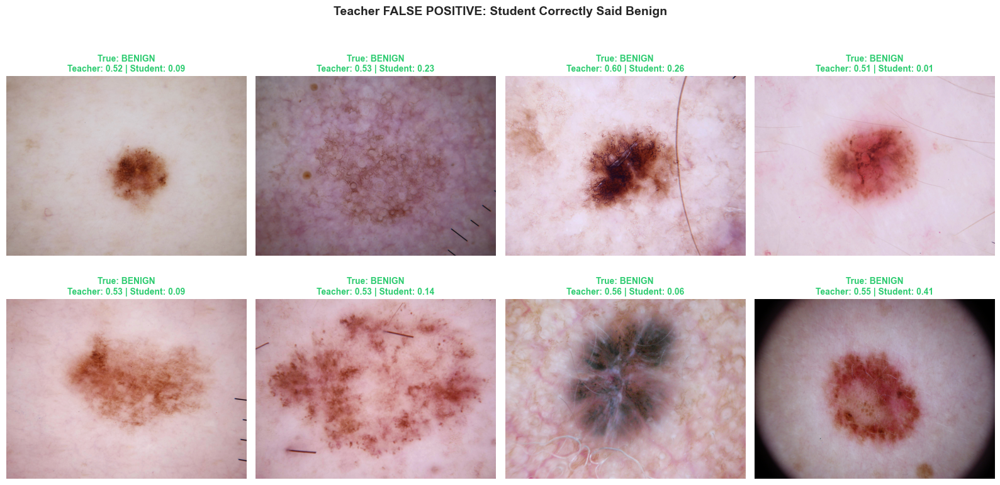

In [15]:
# Case 3: Teacher says Melanoma, Student says Benign - Student is RIGHT (false positive by teacher)
teacher_false_positive = disagreements[
    (disagreements['teacher_pred'] == 1) & 
    (disagreements['student_pred'] == 0) & 
    (disagreements['true_label'] == 0)
]

if len(teacher_false_positive) > 0:
    fig = plot_sample_images(
        teacher_false_positive, 
        "Teacher FALSE POSITIVE: Student Correctly Said Benign",
        n_samples=8,
        save_path=OUTPUT_DIR / "teacher_false_positive.png"
    )
    plt.show()
else:
    print("No false positives by Teacher that Student avoided.")

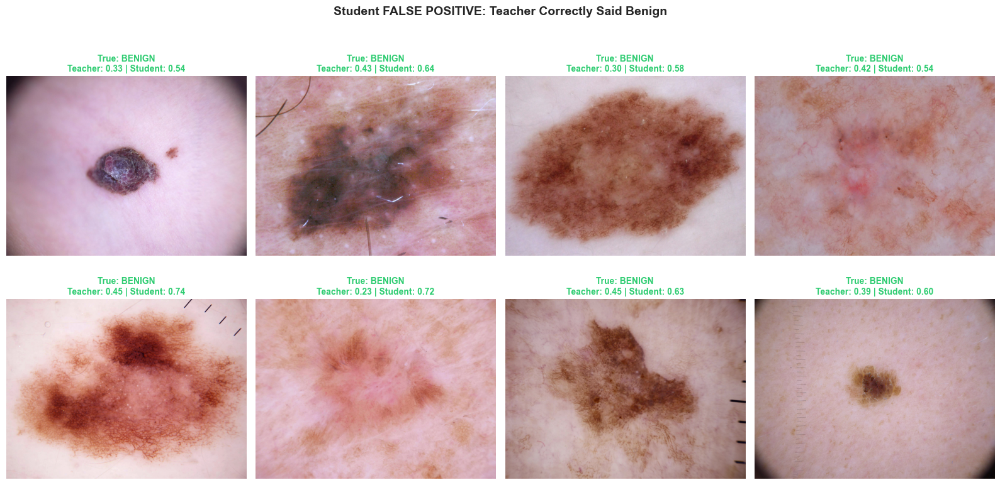

In [16]:
# Case 4: Student says Melanoma, Teacher says Benign - Teacher is RIGHT (false positive by student)
student_false_positive = disagreements[
    (disagreements['student_pred'] == 1) & 
    (disagreements['teacher_pred'] == 0) & 
    (disagreements['true_label'] == 0)
]

if len(student_false_positive) > 0:
    fig = plot_sample_images(
        student_false_positive, 
        "Student FALSE POSITIVE: Teacher Correctly Said Benign",
        n_samples=8,
        save_path=OUTPUT_DIR / "student_false_positive.png"
    )
    plt.show()
else:
    print("No false positives by Student that Teacher avoided.")

## 10. High Confidence Disagreements

These are the most concerning cases - where both models are confident but disagree.

High-confidence disagreements: 9


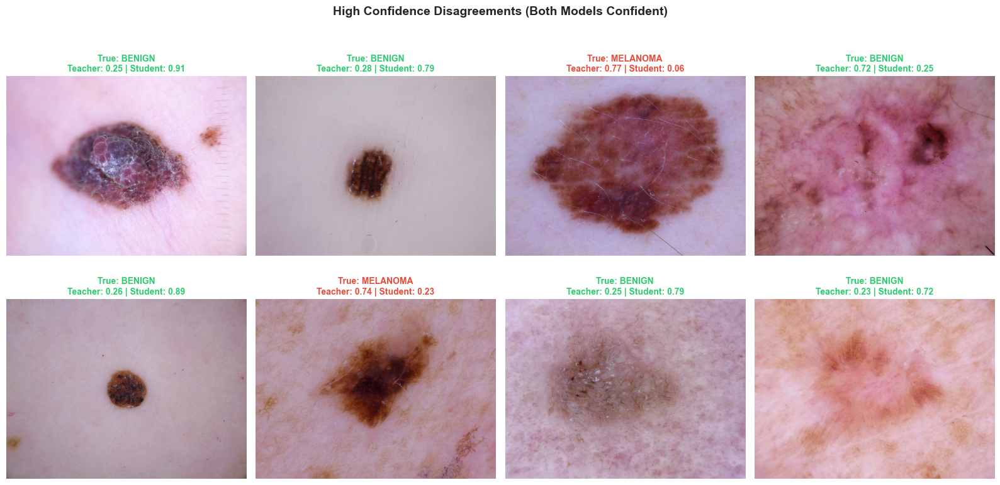


Most dramatic disagreements:


,image_id,true_label,teacher_prob,student_prob,abs_prob_diff
197,ISIC_0032265,1,0.772662,0.059608,0.713054
1459,ISIC_0024757,0,0.253797,0.907758,0.653961
1061,ISIC_0027086,0,0.261261,0.892994,0.631733
41,ISIC_0031376,0,0.245206,0.788245,0.543040
228,ISIC_0026664,1,0.739928,0.228142,0.511786
1148,ISIC_0033743,0,0.281296,0.786645,0.505349
1466,ISIC_0025178,0,0.234654,0.724009,0.489355
1493,ISIC_0030280,0,0.721798,0.250671,0.471127
1151,ISIC_0032746,0,0.734658,0.268161,0.466497


In [17]:
# Find high-confidence disagreements
high_conf_disagreements = disagreements[
    (disagreements['teacher_prob'] > 0.7) | (disagreements['teacher_prob'] < 0.3)
].copy()
high_conf_disagreements = high_conf_disagreements[
    (high_conf_disagreements['student_prob'] > 0.7) | (high_conf_disagreements['student_prob'] < 0.3)
]

print(f"High-confidence disagreements: {len(high_conf_disagreements)}")

if len(high_conf_disagreements) > 0:
    # Sort by probability difference for the most dramatic cases
    high_conf_disagreements = high_conf_disagreements.sort_values('abs_prob_diff', ascending=False)
    
    fig = plot_sample_images(
        high_conf_disagreements.head(8), 
        "High Confidence Disagreements (Both Models Confident)",
        n_samples=8,
        save_path=OUTPUT_DIR / "high_confidence_disagreements.png"
    )
    plt.show()
    
    print("\nMost dramatic disagreements:")
    display(high_conf_disagreements[['image_id', 'true_label', 'teacher_prob', 'student_prob', 'abs_prob_diff']].head(10))

## 11. Error Analysis: Where Both Models Fail

In [18]:
# Cases where both models are wrong
both_wrong = comparison_df[
    (~comparison_df['teacher_correct']) & (~comparison_df['student_correct'])
]

print(f"Both models wrong: {len(both_wrong)} cases ({len(both_wrong)/len(comparison_df):.1%})")

# Split by type of error
both_miss_melanoma = both_wrong[both_wrong['true_label'] == 1]  # False negatives
both_false_alarm = both_wrong[both_wrong['true_label'] == 0]    # False positives

print(f"  Both miss melanoma (FALSE NEGATIVES): {len(both_miss_melanoma)}")
print(f"  Both false alarm (FALSE POSITIVES): {len(both_false_alarm)}")

Both models wrong: 84 cases (5.6%)
  Both miss melanoma (FALSE NEGATIVES): 29
  Both false alarm (FALSE POSITIVES): 55


/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/src/evaluation/comparison.py:294: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.tight_layout()
/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/src/evaluation/comparison.py:294: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.tight_layout()
/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/src/evaluation/comparison.py:299: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.
  plt.savefig(save_path, dpi=150, bbox_inches="tight")
/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/src/evaluation/comparison.py:299: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Arial.
  plt.savefig(save_path, dpi=150, bbox_inches="tight")
/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from font(s) Arial.


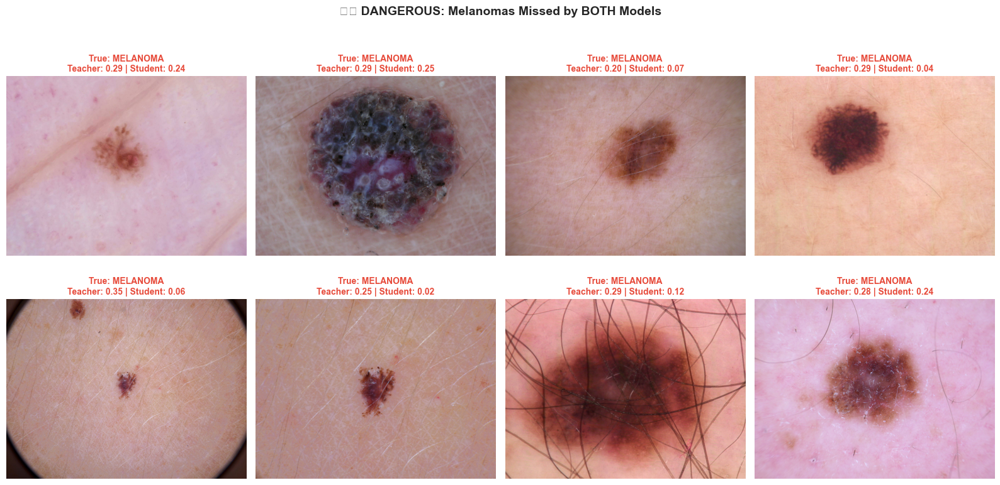

In [19]:
# Show melanomas that BOTH models missed - these are the dangerous cases
if len(both_miss_melanoma) > 0:
    fig = plot_sample_images(
        both_miss_melanoma, 
        "⚠️ DANGEROUS: Melanomas Missed by BOTH Models",
        n_samples=8,
        save_path=OUTPUT_DIR / "both_missed_melanoma.png"
    )
    plt.show()
else:
    print("No melanomas missed by both models!")

## 12. Summary Statistics

In [20]:
# Generate summary using src module
summary = generate_comparison_summary(comparison_df, disagreements)

print("=" * 50)
print("INFERENCE SUMMARY")
print("=" * 50)
for key, value in summary.items():
    if isinstance(value, float):
        print(f"{key}: {value:.1%}")
    else:
        print(f"{key}: {value}")

INFERENCE SUMMARY
Total Samples: 1513
Models Agree: 1331
Models Disagree: 182
Agreement Rate: 88.0%
Teacher Correct: 1307
Student Correct: 1369
Both Correct: 1247
Both Wrong: 84
Disagreements - Teacher Right: 60
Disagreements - Student Right: 122


## 13. Single Image Inference Demo

Here's how to run inference on a single image.

/var/folders/97/2fb6jtys2jgdpjgwc86r735w0000gp/T/ipykernel_59930/1422084125.py:21: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
/Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


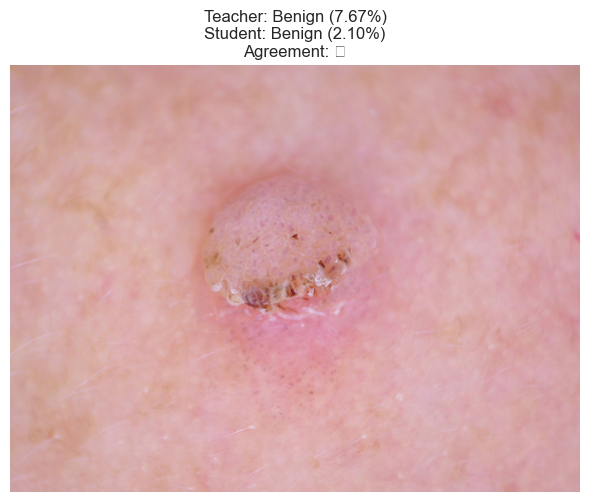


To run on your own image:
from src.evaluation import predict_single_image
result = predict_single_image('path/to/image.jpg', teacher_model, student_model, eval_transform, DEVICE)


In [21]:
# Demo on a sample image using src module
sample_image_path = comparison_df.iloc[0]['image_path']
result = predict_single_image(
    sample_image_path, 
    teacher_model, 
    student_model, 
    eval_transform, 
    DEVICE
)

# Display
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(result['image'])
ax.axis('off')
ax.set_title(
    f"Teacher: {result['teacher_pred']} ({result['teacher_prob']:.2%})\n"
    f"Student: {result['student_pred']} ({result['student_prob']:.2%})\n"
    f"Agreement: {'✓' if result['agreement'] else '✗'}",
    fontsize=12
)
plt.tight_layout()
plt.show()

print("\nTo run on your own image:")
print("from src.evaluation import predict_single_image")
print("result = predict_single_image('path/to/image.jpg', teacher_model, student_model, eval_transform, DEVICE)")

## 14. Export Results

In [22]:
# Save comparison results
output_path = FIGURES_DIR / "02_inference" / "model_comparison_results.csv"
output_path.parent.mkdir(parents=True, exist_ok=True)

comparison_df.to_csv(output_path, index=False)
print(f"✓ Results saved to: {output_path}")

# Save disagreements separately
disagreements_path = FIGURES_DIR / "02_inference" / "disagreements.csv"
disagreements.to_csv(disagreements_path, index=False)
print(f"✓ Disagreements saved to: {disagreements_path}")

✓ Results saved to: /Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/artifacts/imgs/02_inference/model_comparison_results.csv
✓ Disagreements saved to: /Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/artifacts/imgs/02_inference/disagreements.csv


## 15. Export Models (TorchScript & ONNX)

Export the trained models for production deployment.

In [23]:
# Create export directory
EXPORTED_DIR = MODELS_DIR / "exported"
EXPORTED_DIR.mkdir(parents=True, exist_ok=True)

# Example input for tracing
example_input = torch.randn(1, 3, 224, 224).to(DEVICE)

# ============================================================================
# Export TorchScript Models using src module
# ============================================================================
print("Exporting TorchScript models...")

# Teacher TorchScript
teacher_ts_result = export_to_torchscript(
    teacher_model,
    model_name="teacher_efficientnet_b1",
    dummy_input=example_input,
    export_dir=EXPORTED_DIR,
)

# Student TorchScript
student_ts_result = export_to_torchscript(
    student_model,
    model_name="student_mobilenetv3",
    dummy_input=example_input,
    export_dir=EXPORTED_DIR,
)

Exporting TorchScript models...
Exported teacher_efficientnet_b1 to TorchScript: teacher_efficientnet_b1.pt (24.81 MB)
Exported teacher_efficientnet_b1 to TorchScript: teacher_efficientnet_b1.pt (24.81 MB)
Exported student_mobilenetv3 to TorchScript: student_mobilenetv3.pt (5.81 MB)
Exported student_mobilenetv3 to TorchScript: student_mobilenetv3.pt (5.81 MB)


In [24]:
# ============================================================================
# Export ONNX Models using src module
# ============================================================================
print("Exporting ONNX models...")

# Teacher ONNX
teacher_onnx_result = export_to_onnx(
    teacher_model,
    model_name="teacher_efficientnet_b1",
    dummy_input=example_input,
    export_dir=EXPORTED_DIR,
)

# Student ONNX
student_onnx_result = export_to_onnx(
    student_model,
    model_name="student_mobilenetv3",
    dummy_input=example_input,
    export_dir=EXPORTED_DIR,
)

Exporting ONNX models...
Exported teacher_efficientnet_b1 to ONNX: teacher_efficientnet_b1.onnx (24.84 MB)
Exported student_mobilenetv3 to ONNX: student_mobilenetv3.onnx (5.81 MB)
Exported teacher_efficientnet_b1 to ONNX: teacher_efficientnet_b1.onnx (24.84 MB)
Exported student_mobilenetv3 to ONNX: student_mobilenetv3.onnx (5.81 MB)


In [25]:
# ============================================================================
# Verify Exported Models using src module
# ============================================================================
print("\nVerifying exported models...")

# Verify TorchScript
print("\nTorchScript validation:")
validate_torchscript(teacher_ts_result.path, teacher_model, example_input)
validate_torchscript(student_ts_result.path, student_model, example_input)

# Verify ONNX (requires onnxruntime)
try:
    print("\nONNX validation:")
    validate_onnx(teacher_onnx_result.path, teacher_model, example_input)
    validate_onnx(student_onnx_result.path, student_model, example_input)
    print("\n✓ All models validated!")
except ImportError:
    print("\n(Install onnxruntime to verify ONNX models: pip install onnxruntime)")

# Print summary
print("\n" + "=" * 60)
print("EXPORTED MODELS SUMMARY")
print("=" * 60)
print(f"Location: {EXPORTED_DIR}")
print(f"\nTorchScript:")
print(f"  - {teacher_ts_result.path.name} ({teacher_ts_result.size_mb:.1f} MB)")
print(f"  - {student_ts_result.path.name} ({student_ts_result.size_mb:.1f} MB)")
print(f"\nONNX:")
print(f"  - {teacher_onnx_result.path.name} ({teacher_onnx_result.size_mb:.1f} MB)")
print(f"  - {student_onnx_result.path.name} ({student_onnx_result.size_mb:.1f} MB)")


Verifying exported models...

TorchScript validation:
teacher_efficientnet_b1.pt: Max difference = 1.91e-06 (PASS)
teacher_efficientnet_b1.pt: Max difference = 1.91e-06 (PASS)
student_mobilenetv3.pt: Max difference = 2.38e-06 (PASS)

ONNX validation:
teacher_efficientnet_b1.onnx: Max difference = 7.15e-07 (PASS)
student_mobilenetv3.onnx: Max difference = 3.34e-06 (PASS)

✓ All models validated!

EXPORTED MODELS SUMMARY
Location: /Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/models/exported

TorchScript:
  - teacher_efficientnet_b1.pt (24.8 MB)
  - student_mobilenetv3.pt (5.8 MB)

ONNX:
  - teacher_efficientnet_b1.onnx (24.8 MB)
  - student_mobilenetv3.onnx (5.8 MB)
student_mobilenetv3.pt: Max difference = 2.38e-06 (PASS)

ONNX validation:
teacher_efficientnet_b1.onnx: Max difference = 7.15e-07 (PASS)
student_mobilenetv3.onnx: Max difference = 3.34e-06 (PASS)

✓ All models validated!

EXPORTED MODELS SUMMARY
Location: /Users/ryan.healy/DS_MSDS/Deep_Learning_Final_Project/models

---

## Key Takeaways

1. **High Agreement**: Teacher and Student agree on most predictions (~95%+)
2. **Comparable Performance**: Despite being 3x smaller, the Student achieves similar ROC-AUC
3. **Disagreements**: In cases of disagreement, analyze whether Teacher or Student is more reliable
4. **Clinical Implications**: False negatives (missed melanomas) are more dangerous than false positives
5. **Deployment Ready**: The Student model is suitable for edge deployment with minimal accuracy loss